In [4]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import math
import matplotlib.image as mpimg
import random
import pandas
from scipy import ndimage

#Images

In [13]:
Elaine = cv2.imread('Elaine.bmp', cv2.IMREAD_GRAYSCALE)

#Utils

In [14]:
def imshow(*args, title=None, figsize=20, to_rgb=True, fontsize=12):
    if isinstance(figsize, int):
        figsize = (figsize, figsize)
    images = args[0] if type(args[0]) is list else list(args)
    if to_rgb:
        images = list(map(lambda x: cv2.cvtColor(x, cv2.COLOR_BGR2RGB), images))
    if title is not None:
        assert len(title) == len(images), "Please provide a title for each image."
    plt.figure(figsize=figsize)
    for i in range(1, len(images)+1):
        plt.subplot(len(images), 1, i)
        if title is not None:
            plt.title(title[i-1], fontsize=fontsize)
        if images[i-1].ndim == 2:
            plt.imshow(images[i-1], cmap='gray')
        else:
            plt.imshow(images[i-1])
        plt.axis('off')

In [15]:
def mse(imageA, imageB):
	return np.square(imageA.astype('int16') - 
	                 imageB.astype('int16')).mean()

In [16]:
def filter2d(image, kernel, normalize_filter=True):
    assert image.ndim == 2, "Invalid image shape."
    assert kernel.ndim == 2, "Invalid kernel shape."
    assert kernel.shape[0] % 2 == 1 and kernel.shape[1] % 2 == 1, "Please use odd-sized kernel."
    h = int(kernel.shape[0] // 2)
    w = int(kernel.shape[1] // 2)

    image = image.copy().astype('float32')
    result = np.zeros_like(image)
    image = cv2.copyMakeBorder(image, h, h, w, w, cv2.BORDER_CONSTANT, 0)
    
    kernel = kernel.astype('float32')
    if normalize_filter and kernel.sum() != 1:
        kernel = kernel / kernel.sum()

    for i in range(result.shape[0]):
        for j in range(result.shape[1]):
            x, y = i + h, j + w
            x_start = x - h
            x_end = x + h + 1
            y_start = y - w
            y_end = y + w + 1
            window = image[x_start:x_end, y_start:y_end]
            value = (window * kernel).sum()
            result[i, j] = value
    
    result = np.clip(result, 0, 255).astype('uint8')
    return result

In [17]:
# source: https://stackoverflow.com/a/27342545
def sp_noise(image,prob):
    '''
    Add salt and pepper noise to image
    prob: Probability of the noise
    '''
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdn = random.random()
            if rdn < prob:
                output[i][j] = 0
            elif rdn > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output

In [18]:
def gaussian_noise(image, sigma):
  row,col = image.shape
  mean = 0
  gauss = np.random.normal(mean, sigma, (row,col))
  gauss = gauss.reshape(row,col)
  noisy = image + gauss
  
  return noisy

In [19]:
# source = https://github.com/MeteHanC/Python-Median-Filter.git
def median_filter(data, filter_size):
    temp = []
    indexer = filter_size // 2
    data_final = []
    data_final = np.zeros((len(data),len(data[0])))
    for i in range(len(data)):

        for j in range(len(data[0])):

            for z in range(filter_size):
                if i + z - indexer < 0 or i + z - indexer > len(data) - 1:
                    for c in range(filter_size):
                        temp.append(0)
                else:
                    if j + z - indexer < 0 or j + indexer > len(data[0]) - 1:
                        temp.append(0)
                    else:
                        for k in range(filter_size):
                            temp.append(data[i + z - indexer][j + k - indexer])

            temp.sort()
            data_final[i][j] = temp[len(temp) // 2]
            temp = []
    return data_final

#3.1 Box Filter

##3.1.3

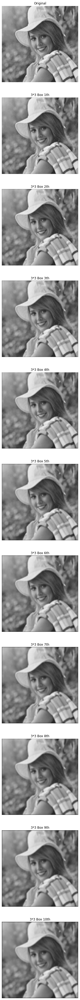

In [20]:
blurred_fixed_size = [Elaine]
titles = ['Original']  

for i in range(10):
  kernel = np.ones((3,3), dtype='uint8') / (3*3)
  last_item = len(blurred_fixed_size) - 1
  out = filter2d(blurred_fixed_size[last_item], kernel)
  blurred_fixed_size.append(out)
  titles.append(f'3*3 Box {i+1}th')
  # mpimg.imsave(f'3*3 Box {i+1}th.png', out,cmap='gray')

imshow(blurred_fixed_size, title=titles, figsize=70)

##3.1.4

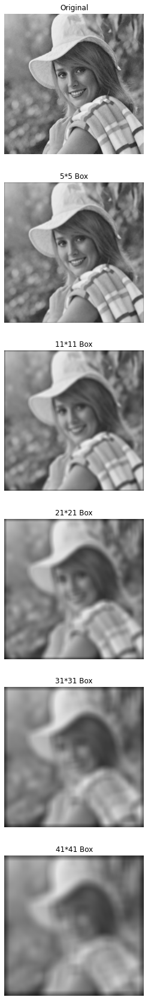

In [21]:
images = [Elaine]
titles = ['Original']
for k in [5, 11, 21, 31, 41]:
    kernel = np.ones((k,k), dtype='uint8') / (k*k)
    out = filter2d(Elaine, kernel)
    images.append(out)
    titles.append(f'{k}*{k} Box')
    # mpimg.imsave(f'{k}*{k} Box.png',out,cmap='gray')

imshow(images, title=titles, figsize=30)

##3.1.6

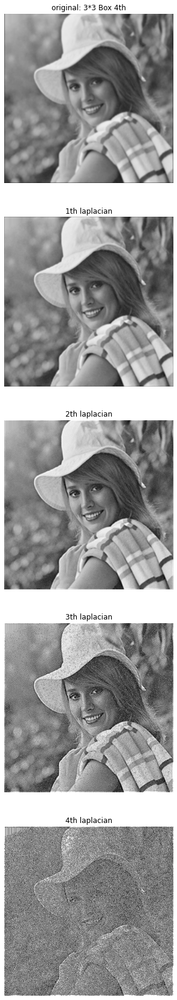

In [22]:
# test on the 4th output of section 3.1.3
laplacianed = [blurred_fixed_size[3]]
titles = [f'original: 3*3 Box 4th']  
for i in range(4):
  kernel = np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])
  last_item = len(laplacianed) - 1
  out = filter2d(laplacianed[last_item], kernel)
  laplacianed.append(out)
  titles.append(f'{i+1}th laplacian')

imshow(laplacianed, title=titles,figsize=30)

#3.2 Median Filter

##3.2.1

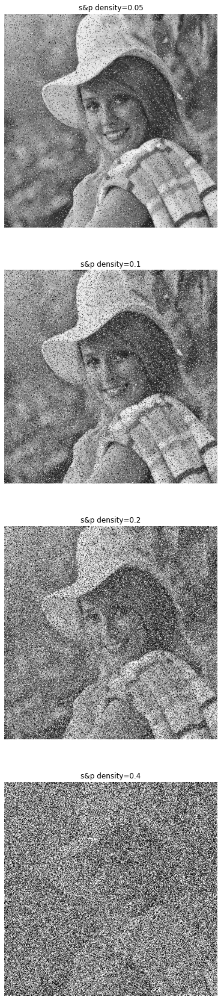

In [23]:
noisy_images = []
titles = []
for i in [0.05, 0.1, 0.2, 0.4]:
  noisy_pic = sp_noise(Elaine,i)
  noisy_images.append(noisy_pic)
  titles.append(f's&p density={i}')
  mpimg.imsave(f's&p density={i}.png', noisy_pic,cmap='gray')

imshow(noisy_images,title = titles, figsize=30)

###Median filter on noisy images

In [24]:
window_sizes = [3,5,7,9]

####noisy images density = 0.05

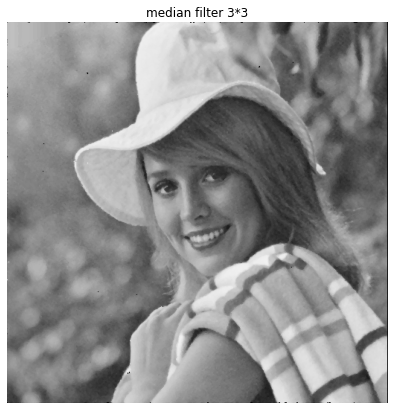

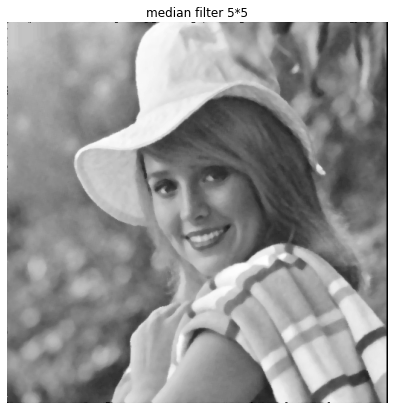

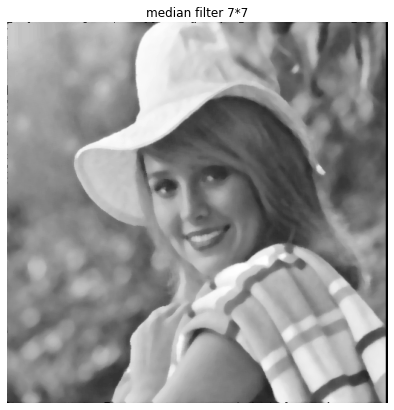

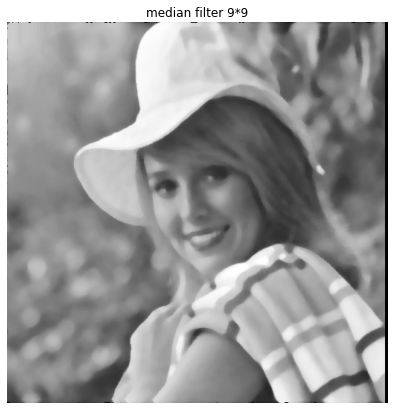

In [25]:
# noisy image with density = 0.05
image = noisy_images[0]
density_0_0_5 = []

for i in range(len(window_sizes)):
  size =  window_sizes[i]
  pic = median_filter(image,size)
  density_0_0_5.append(pic)
  imshow(pic, title=[f'median filter {size}*{size}'],figsize=7,to_rgb=False)
  # mpimg.imsave(f'median filter {size}*{size}.png', pic,cmap='gray')

####noisy images density = 0.1

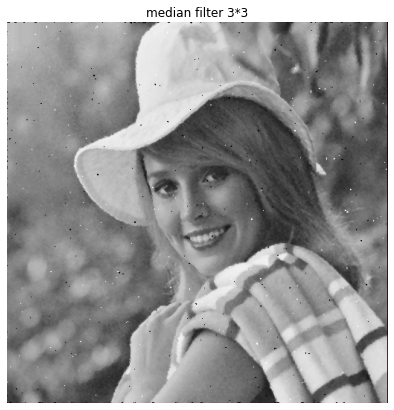

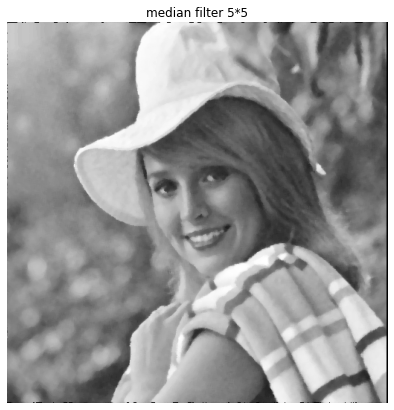

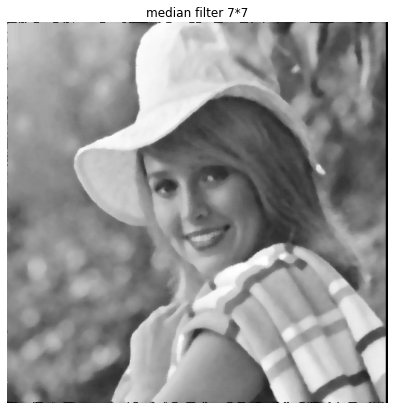

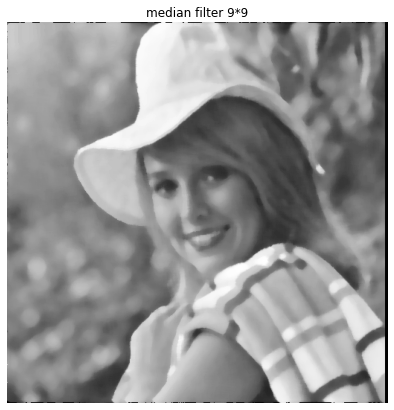

In [26]:
# noisy image with density = 0.1
image = noisy_images[1]
density_0_1 = []

for i in range(len(window_sizes)):
  size =  window_sizes[i]
  pic = median_filter(image,size)
  density_0_1.append(pic)
  imshow(pic, title=[f'median filter {size}*{size}'],figsize=7,to_rgb=False)
  # mpimg.imsave(f'median filter {size}*{size} on density=0.1.png', pic,cmap='gray')

####noisy images density = 0.2

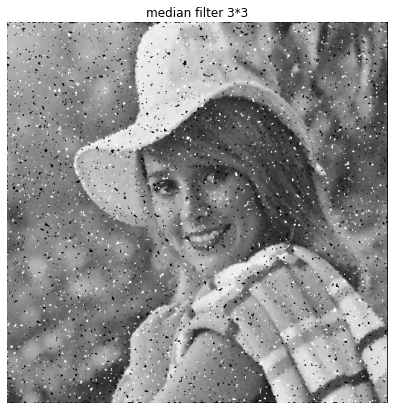

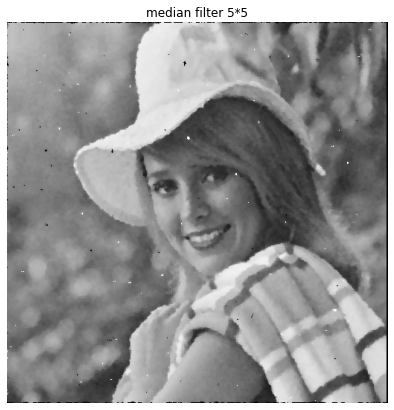

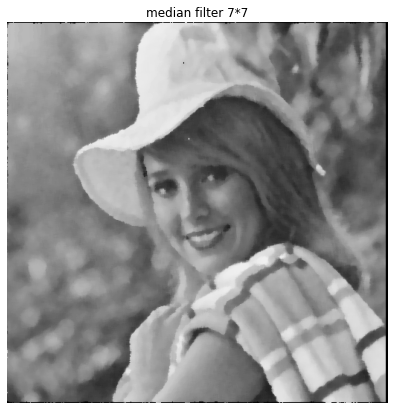

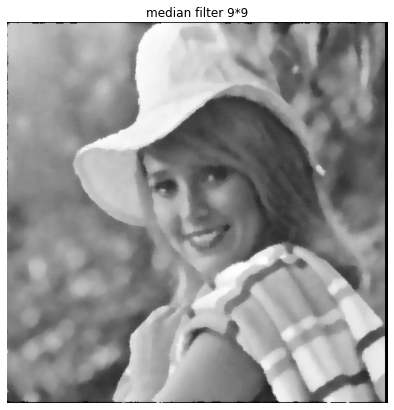

In [27]:
# noisy image with density = 0.2
image = noisy_images[2]
density_0_2 = []

for i in range(len(window_sizes)):
  size =  window_sizes[i]
  pic = median_filter(image,size)
  density_0_2.append(pic)
  imshow(pic, title=[f'median filter {size}*{size}'],figsize=7,to_rgb=False)
  # mpimg.imsave(f'median filter {size}*{size} on density=0.2.png', pic,cmap='gray')

####noisy images density = 0.4

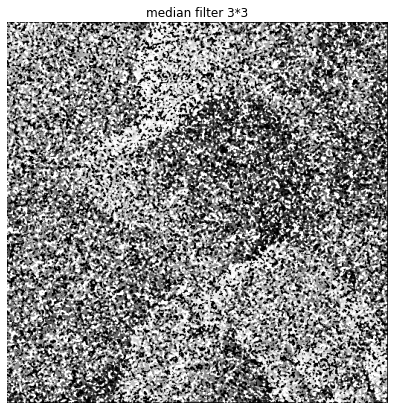

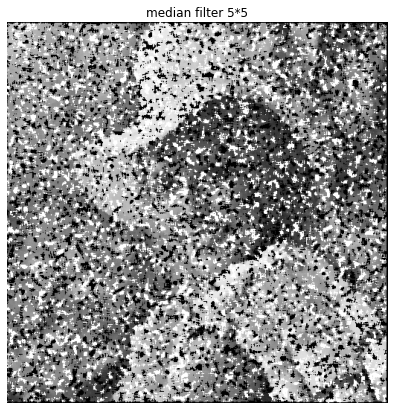

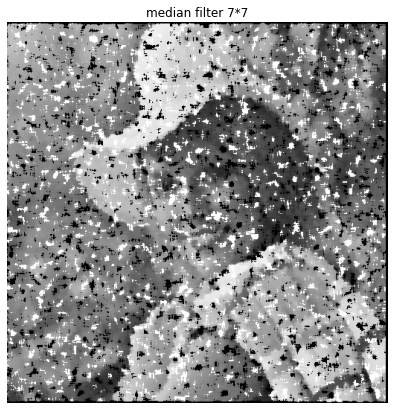

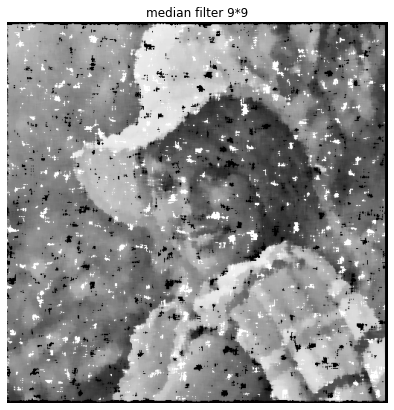

In [28]:
# noisy image with density = 0.4
image = noisy_images[3]
density_0_4 = []

for i in range(len(window_sizes)):
  size =  window_sizes[i]
  pic = median_filter(image,size)
  density_0_4.append(pic)
  imshow(pic, title=[f'median filter {size}*{size}'],figsize=7,to_rgb=False)
  # mpimg.imsave(f'median filter {size}*{size} on density=0.4.png', pic,cmap='gray')

####MSE

In [29]:
pandas.DataFrame(columns=('noise', '3x3', '5x5','7x7','9x9'),
                 data=[('0.05', mse(density_0_0_5[0], Elaine), mse(density_0_0_5[1], Elaine), mse(density_0_0_5[2], Elaine),mse(density_0_0_5[3], Elaine)),
                       ('0.1', mse(density_0_1[0], Elaine), mse(density_0_1[1], Elaine), mse(density_0_1[2], Elaine),mse(density_0_1[3], Elaine)),
                       ('0.2', mse(density_0_2[0], Elaine), mse(density_0_2[1], Elaine), mse(density_0_2[2], Elaine),mse(density_0_2[3], Elaine)),
                       ('0.4', mse(density_0_4[0], Elaine), mse(density_0_4[1], Elaine), mse(density_0_4[2], Elaine),mse(density_0_4[3], Elaine))
                       ])

,noise,3x3,5x5,7x7,9x9
0,0.05,59.354477,86.882679,114.565239,146.523148
1,0.1,90.103203,96.165604,124.038120,161.385902
2,0.2,476.280121,136.439201,154.445518,192.796368
3,0.4,5059.236965,3069.322514,1696.149845,972.843185


##3.2.2

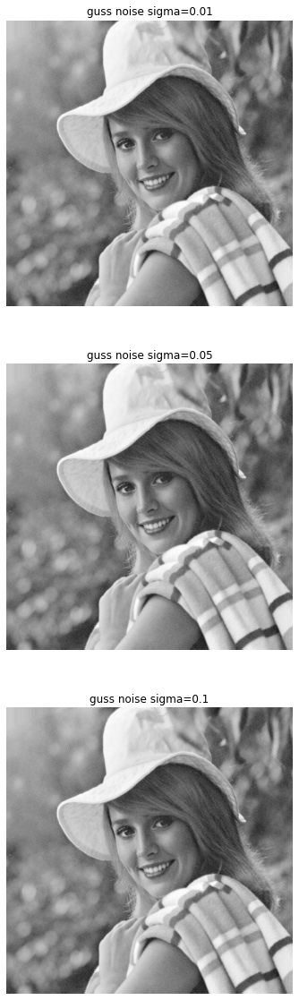

In [30]:
noisy_images_guss = []
titles = []
for i in [0.01, 0.05, 0.1]:
  pic = gaussian_noise(Elaine, i)
  noisy_images_guss.append(pic)
  titles.append(f'guss noise sigma={i}')
  # mpimg.imsave(f'guss noise sigma={i}.png', pic,cmap='gray')

imshow(noisy_images_guss, title=titles, figsize = 20 ,to_rgb = False)

### sigma = 0.01

In [31]:
image1 = noisy_images_guss[0]

####Average filter

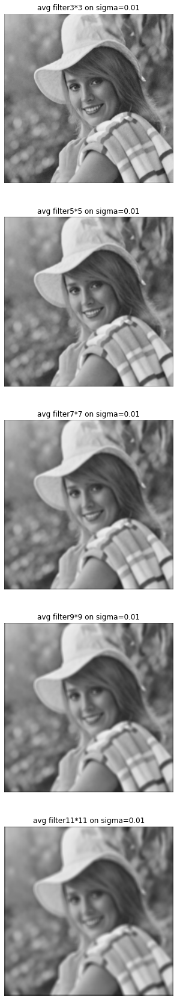

In [32]:
avg_0_0_1 = []
titles = []

for k in [3, 5, 7, 9, 11]:
    kernel = np.ones((k,k), dtype='uint8') / (k*k)
    out = filter2d(image1, kernel)
    avg_0_0_1.append(out)
    titles.append(f'avg filter{k}*{k} on sigma=0.01')
    # mpimg.imsave(f'avg filter{k}*{k} on sigma=0.01.png', out,cmap='gray')

imshow(avg_0_0_1, title = titles , figsize=30)    

####Median filter

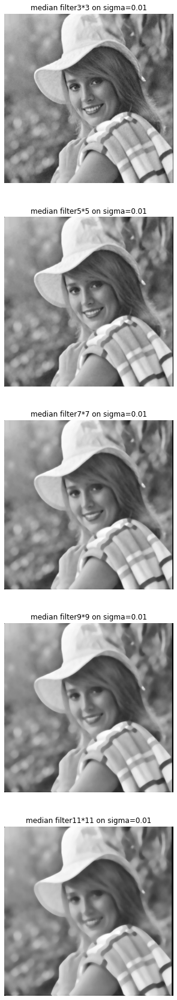

In [33]:
median_0_0_1 = []
titles = []

for k in [3, 5, 7, 9, 11]:
    out = median_filter(image1, k)
    median_0_0_1.append(out)
    titles.append(f'median filter{k}*{k} on sigma=0.01')
    # mpimg.imsave(f'median filter{k}*{k} on sigma=0.01.png', out,cmap='gray')

imshow(median_0_0_1, title = titles , figsize=30, to_rgb = False)  

###sigma = 0.05

In [34]:
image2 = noisy_images_guss[1]

####Average filter

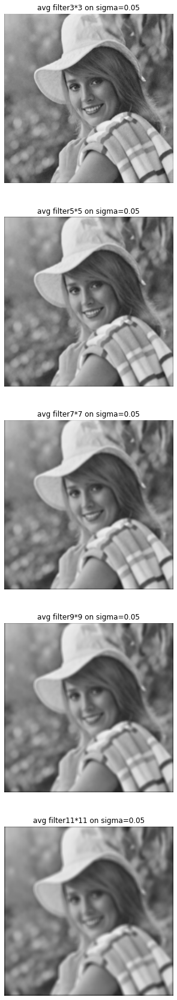

In [35]:
avg_0_0_5 = []
titles = []

for k in [3, 5, 7, 9, 11]:
    kernel = np.ones((k,k), dtype='uint8') / (k*k)
    out = filter2d(image2, kernel)
    avg_0_0_5.append(out)
    titles.append(f'avg filter{k}*{k} on sigma=0.05')
    # mpimg.imsave(f'avg filter{k}*{k} on sigma=0.05.png', out,cmap='gray')

imshow(avg_0_0_5, title = titles , figsize=30)   

####Median filter

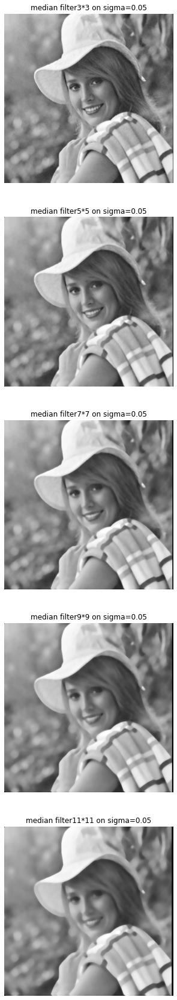

In [36]:
median_0_0_5 = []
titles = []

for k in [3, 5, 7, 9, 11]:
    out = median_filter(image2, k)
    median_0_0_5.append(out)
    titles.append(f'median filter{k}*{k} on sigma=0.05')
    mpimg.imsave(f'median filter{k}*{k} on sigma=0.05.png', out,cmap='gray')

imshow(median_0_0_5, title = titles , figsize=30, to_rgb = False)

###sigma = 0.1

In [37]:
image3 = noisy_images_guss[2]

####Average filter

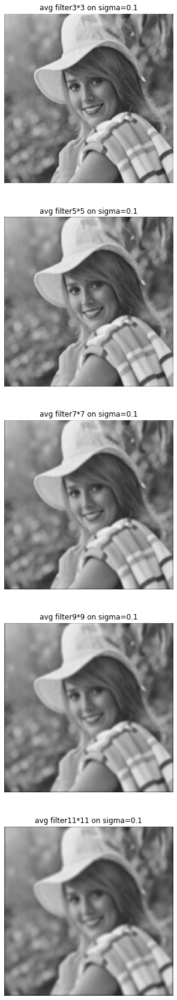

In [38]:
avg_0_1 = []
titles = []

for k in [3, 5, 7, 9, 11]:
    kernel = np.ones((k,k), dtype='uint8') / (k*k)
    out = filter2d(image3, kernel)
    avg_0_1.append(out)
    titles.append(f'avg filter{k}*{k} on sigma=0.1')
    # mpimg.imsave(f'avg filter{k}*{k} on sigma=0.1.png', out,cmap='gray')

imshow(avg_0_1, title = titles , figsize=30)

####Median filter

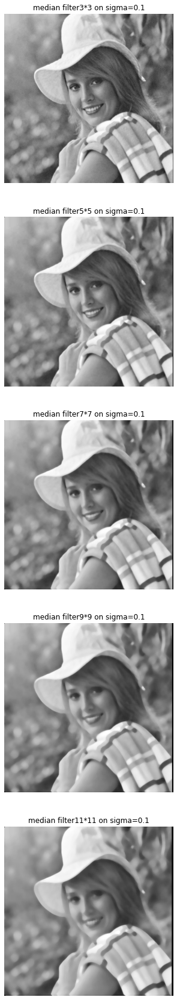

In [39]:
median_0_1 = []
titles = []

for k in [3, 5, 7, 9, 11]:
    out = median_filter(image3, k)
    median_0_1.append(out)
    titles.append(f'median filter{k}*{k} on sigma=0.1')
    mpimg.imsave(f'median filter{k}*{k} on sigma=0.1.png', out,cmap='gray')

imshow(median_0_1, title = titles , figsize=30, to_rgb = False)

###mse

In [40]:
pandas.DataFrame(columns=('', 'median 3x3', 'median 5x5','median 7x7','median 9x9','median 11x11','box filter 3x3','boxfilter 5x5','boxfilter 7x7','boxfilter 9x9','boxfilter 11x11'),
                 data=[('𝝈 = 0.01', mse(median_0_0_1[0], Elaine), mse(median_0_0_1[1], Elaine), mse(median_0_0_1[2], Elaine),mse(median_0_0_1[3], Elaine),mse(median_0_0_1[4], Elaine),
                        mse(avg_0_0_1[0], Elaine), mse(avg_0_0_1[1], Elaine), mse(avg_0_0_1[2], Elaine),mse(avg_0_0_1[3], Elaine),mse(avg_0_0_1[4], Elaine)
                 ),
                       ('𝝈 = 0.05', mse(median_0_0_5[0], Elaine), mse(median_0_0_5[1], Elaine), mse(median_0_0_5[2], Elaine),mse(median_0_0_5[3], Elaine),mse(median_0_0_5[4], Elaine),
                        mse(avg_0_0_5[0], Elaine), mse(avg_0_0_5[1], Elaine), mse(avg_0_0_5[2], Elaine),mse(avg_0_0_5[3], Elaine),mse(avg_0_0_5[4], Elaine)
                       ),
                       ('𝝈 = 0.1', mse(median_0_1[0], Elaine), mse(median_0_1[1], Elaine), mse(median_0_1[2], Elaine),mse(median_0_1[3], Elaine),mse(median_0_1[4], Elaine),
                        mse(avg_0_1[0], Elaine), mse(avg_0_1[1], Elaine), mse(avg_0_1[2], Elaine),mse(avg_0_1[3], Elaine),mse(avg_0_1[4], Elaine)
                       )
                       ])

,,median 3x3,median 5x5,median 7x7,median 9x9,median 11x11,box filter 3x3,boxfilter 5x5,boxfilter 7x7,boxfilter 9x9,boxfilter 11x11
0,𝝈 = 0.01,53.244194,82.896866,110.708405,143.119946,177.577808,53.386543,87.408482,121.901054,162.542725,204.803329
1,𝝈 = 0.05,53.247936,82.895302,110.716625,143.103718,177.560104,53.387115,87.409344,121.892860,162.550606,204.806347
2,𝝈 = 0.1,53.243458,82.889740,110.720116,143.136639,177.541630,53.380325,87.401493,121.900661,162.546200,204.805515


## 3.2.3

In [41]:
def get_gaussian_kernel(k, sigma=-1):
    kernel = cv2.getGaussianKernel(k, sigma)
    kernel /= kernel[0,0]
    kernel = kernel @ kernel.T
    kernel /= kernel.sum()
    return kernel

In [42]:
def remove_mixed_noise(image, median_kernel=3, gaussian_kernel=5, gaussian_var=1.2):
    # 1. Remove salt & pepper noise using median filter
    image = median_filter(image, median_kernel)

    # 2. Remove gaussian noise using gaussian filter
    gaussian_kernel = get_gaussian_kernel(gaussian_kernel, gaussian_var)
    image = filter2d(image, gaussian_kernel)

    return np.clip(image, 0, 256).astype('uint8')

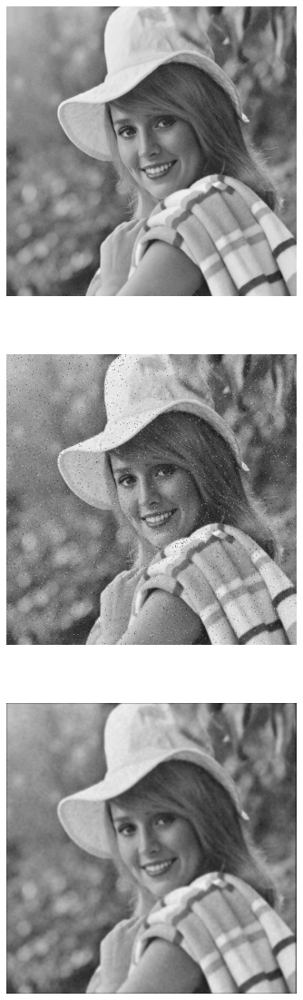

In [43]:
noisy_mix = gaussian_noise(Elaine, 10)
noisy_mix = np.clip(noisy_mix, 0, 256).astype('uint8')
noisy_mix = sp_noise(noisy_mix, 0.005)

denoised = remove_mixed_noise(noisy_mix)

mpimg.imsave(f'noisy_mix.png', noisy_mix, cmap='gray')
mpimg.imsave(f'noisy_mix_denoised.png', denoised, cmap='gray')

imshow(Elaine, noisy_mix, denoised)

# 3.3 sharpening, Blurring, and Noise Removal


##3.3.1

In [47]:
my_noisy_img = cv2.imread('my_noisy_image.jpg', cv2.IMREAD_GRAYSCALE)

# Median Filter
result = median_filter(my_noisy_img, 5)
result = np.clip(result, 0, 256).astype('uint8')

# High-boost Filter
smoothed = filter2d(result, get_gaussian_kernel(3))
details = result - smoothed
k = 2
result = result + k*details

# mpimg.imsave(f'my_image_denoised.png', result, cmap='gray')

imshow(my_noisy_img, result)

TypeError: ignored

#3.4 Edge Detection 

## 3.4.1

In [48]:
def normalize(a):
    return np.clip(((a - a.min()) / (a.max() - a.min())) * 255, 0, 256).astype('uint8')

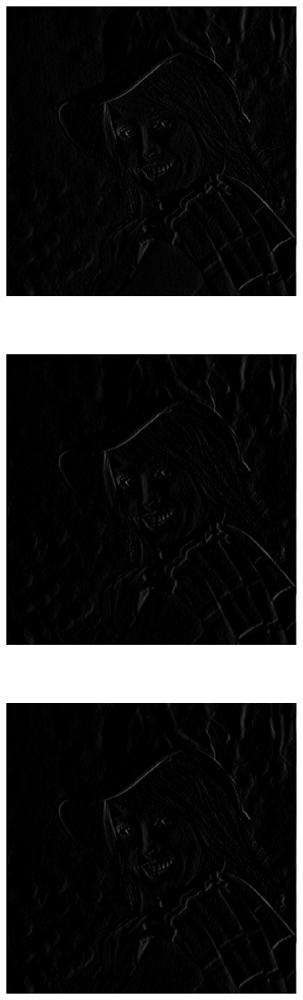

In [49]:
filter_a = np.array([[1, 0, -1]], dtype='float32') * (1.0/2)
filter_b = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]], dtype='float32') * (1.0/6)
filter_c = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]], dtype='float32') * (1.0/8)

img_a = filter2d(Elaine, filter_a, normalize_filter=False)
img_b = filter2d(Elaine, filter_b, normalize_filter=False)
img_c = filter2d(Elaine, filter_c, normalize_filter=False)

img_a = normalize(img_a)
img_b = normalize(img_b)
img_c = normalize(img_c)

# mpimg.imsave(f'edge_filter_a.png', img_a, cmap='gray')
# mpimg.imsave(f'edge_filter_b.png', img_b, cmap='gray')
# mpimg.imsave(f'edge_filter_c.png', img_c, cmap='gray')

imshow(img_a, img_b, img_c)

## 3.4.2

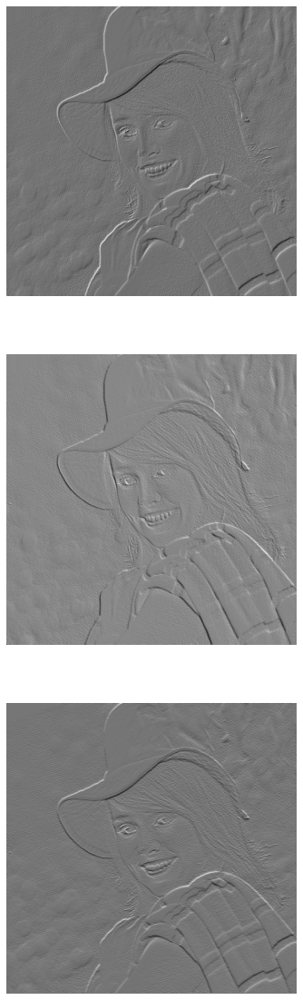

In [50]:
robert_a = np.array([[1,0], [0,-1]])
robert_b = np.array([[0,1], [-1,0]])

img = Elaine / 255.0
result1 = ndimage.convolve(img, robert_a)
result2 = ndimage.convolve(img, robert_b)

result = normalize(result1 + result2)
result1 = normalize(result1)
result2 = normalize(result2)

# mpimg.imsave(f'robert_a.png', result1, cmap='gray')
# mpimg.imsave(f'robert_b.png', result2, cmap='gray')
# mpimg.imsave(f'robert_all.png', result, cmap='gray')

imshow(result1, result2, result)

#3.5 Unsharp Masking

## 3.5.1

In [51]:
img = Elaine.copy().astype('float32')

alpha_set = [0.01, 0.5, 0.99]
kernel_set = [3, 5, 7, 9, 11]

for k in kernel_set:
    for alpha in alpha_set:
        I_prime = filter2d(img, get_gaussian_kernel(k)).astype('float32')
        result = img + alpha * (I_prime - img)
        result = np.clip(result, 0, 256).astype('uint8')
        # mpimg.imsave(f'unsharp_masking_{k}_{alpha}.png', result, cmap='gray')